# Data Casal Montserratina

In [2]:
#Data Manipulation
import pandas as pd
import numpy as np
from datetime import timedelta

import os

# Plots
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

# for EDA
from ydata_profiling import ProfileReport 

#Others
import holidays
from statsmodels.tsa.seasonal import seasonal_decompose

#Parameters Dict
parameters = {
    "paths": {
        "2022_01_06": "../data/data_casal_montserratina/Casal_Montserratina_202201_202206.csv",
        "2022_07_12": "../data/data_casal_montserratina/Casal_Montserratina_202207_202212.csv",
        "2023_01_06": "../data/data_casal_montserratina/Casal_Montserratina_202301_202306.csv",
        "2023_07_12": "../data/data_casal_montserratina/Casal_Montserratina_202307_202312.csv",
        "2024_01_05": "../data/data_casal_montserratina/Casal_Montserratina_202401_202405.csv",
    }
}

In [3]:
ruta_data = "../data/data_casal_montserratina/"

In [4]:
df1 = pd.read_csv(parameters["paths"]["2022_01_06"], delimiter=";")
df2 = pd.read_csv(parameters["paths"]["2022_07_12"], delimiter=";")
df3 = pd.read_csv(parameters["paths"]["2023_01_06"], delimiter=";")
df4 = pd.read_csv(parameters["paths"]["2023_07_12"], delimiter=";")
df5 = pd.read_csv(parameters["paths"]["2024_01_05"], delimiter=";")

In [5]:
# hago un concat de los 4 datasets, para Unir los DataFrames uno a continuación del otro
df = pd.concat([df1, df2, df3, df4, df5], ignore_index=True)

In [6]:
df["TimeStamp"] = pd.to_datetime(df["TimeStamp"], format="%d/%m/%Y %H:%M")
df.rename(columns={'TimeStamp': 'Date'}, inplace=True)
df.rename(columns={'Valor': 'Consumo'}, inplace=True)
df.rename(columns={'Període tarifari': 'Periode_tarifari'}, inplace=True)
df.rename(columns={'Tipus lectura': 'Tipus_lectura'}, inplace=True)

In [7]:
df

,Date,Consumo,Periode_tarifari,Tipus_lectura
0,2022-01-01 00:00:00,6,6,Real
1,2022-01-01 01:00:00,6,6,Real
2,2022-01-01 02:00:00,5,6,Real
3,2022-01-01 03:00:00,7,6,Real
4,2022-01-01 04:00:00,7,6,Real
...,...,...,...,...
17683,2024-05-07 19:00:00,10,4,Real
17684,2024-05-07 20:00:00,7,4,Real
17685,2024-05-07 21:00:00,4,4,Real
17686,2024-05-07 22:00:00,2,5,Real


## EDA

In [8]:
# Generate the report
profile = ProfileReport(df,title="monserratina_2022_2023", tsmode=True, sortby="Date", correlations={"auto": {"calculate": False}})

# Save the report to .html
# profile.to_file("monserratina_2022_2023.html")

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
# Elimino la columna "Tipo de Lectura" & "Periode Tarifari"
df = df.drop(columns=["Tipus_lectura", "Periode_tarifari"])

# Missing values

In [10]:
#Prints the NaN Values per Column of a dataset
def checkNaNValues(df):
    return print(f"NaN Count per Column", df.isna().any(axis=1).sum())

#Checks if there is any missing time series
def checkMissingData(df, date_column):
    min_date = df[date_column].min()
    max_date = df[date_column].max()

    date_range = pd.date_range(start=min_date, end=max_date, freq='h')
    missing_dates = date_range[~date_range.isin(df[date_column])]
    print(f"Number of Missing Values: {missing_dates.shape[0]}")
    return None if missing_dates.shape[0] == 0 else missing_dates, date_range

In [11]:
checkNaNValues(df)
missing_dates, date_range = checkMissingData(df, 'Date')

NaN Count per Column 0
Number of Missing Values: 2906


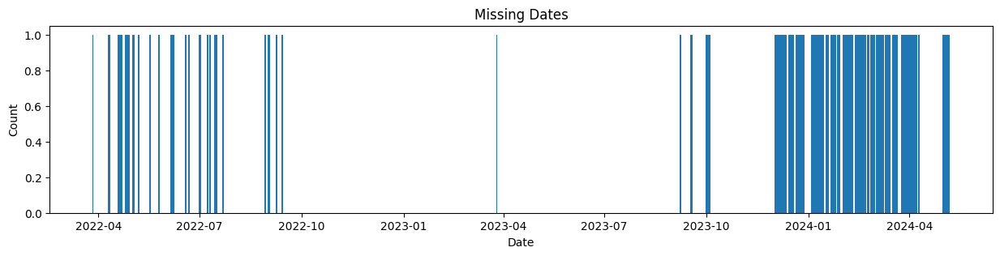

In [12]:
plt.figure(figsize=(15, 3))
plt.bar(missing_dates, [1] * len(missing_dates))
plt.title("Missing Dates")
plt.xlabel("Date")
plt.ylabel("Count")
# plt.xticks(rotation=0)
plt.show()

In [13]:
# para ver un trozo de las fechas faltantes.

print(df[(df["Date"]>"2022-04-09 22:00:00") & (df["Date"]<"2022-04-11 01:00:00")])

# >>>>> notar que entre las 23 del 9/4 a las 00 del 11/4 no hay datos. 

                    Date  Consumo
2374 2022-04-09 23:00:00        2
2375 2022-04-11 00:00:00        2


### rellenar los huecos de Date

In [14]:
new_df = df.drop_duplicates(keep=False) # 
#new_df

In [15]:
new_df.set_index("Date", inplace=True)
#new_df

In [16]:
# Reindexa el DataFrame con el nuevo rango de fechas y rellena los valores faltantes con NaN
data_reindexed = new_df.reindex(date_range)
#data_reindexed

In [17]:
data_reindexed.reset_index(inplace=True)
data_reindexed.rename(columns={'index': 'Date'}, inplace=True)

In [18]:
data_reindexed

,Date,Consumo
0,2022-01-01 00:00:00,6.0
1,2022-01-01 01:00:00,6.0
2,2022-01-01 02:00:00,5.0
3,2022-01-01 03:00:00,7.0
4,2022-01-01 04:00:00,7.0
...,...,...
20587,2024-05-07 19:00:00,10.0
20588,2024-05-07 20:00:00,7.0
20589,2024-05-07 21:00:00,4.0
20590,2024-05-07 22:00:00,2.0


Notar que ahora aparecen rellenas!... con Nulls, tiny bam! 

In [19]:
print(data_reindexed[(data_reindexed["Date"]>"2022-04-09 22:00:00") & (data_reindexed["Date"]<"2022-04-11 01:00:00")])

                    Date  Consumo
2375 2022-04-09 23:00:00      2.0
2376 2022-04-10 00:00:00      NaN
2377 2022-04-10 01:00:00      NaN
2378 2022-04-10 02:00:00      NaN
2379 2022-04-10 03:00:00      NaN
2380 2022-04-10 04:00:00      NaN
2381 2022-04-10 05:00:00      NaN
2382 2022-04-10 06:00:00      NaN
2383 2022-04-10 07:00:00      NaN
2384 2022-04-10 08:00:00      NaN
2385 2022-04-10 09:00:00      NaN
2386 2022-04-10 10:00:00      NaN
2387 2022-04-10 11:00:00      NaN
2388 2022-04-10 12:00:00      NaN
2389 2022-04-10 13:00:00      NaN
2390 2022-04-10 14:00:00      NaN
2391 2022-04-10 15:00:00      NaN
2392 2022-04-10 16:00:00      NaN
2393 2022-04-10 17:00:00      NaN
2394 2022-04-10 18:00:00      NaN
2395 2022-04-10 19:00:00      NaN
2396 2022-04-10 20:00:00      NaN
2397 2022-04-10 21:00:00      NaN
2398 2022-04-10 22:00:00      NaN
2399 2022-04-10 23:00:00      NaN
2400 2022-04-11 00:00:00      2.0


### ahora a rellenar esos NaN!

- calcular el consumo promedio por hora
- reemplazar los NaN por el promedio de su hora

#### fill with hourly mean

In [20]:
df2 = data_reindexed.copy()

In [21]:
# 2. Agrupa los datos por hora y calcula el promedio del consumo para cada hora
consumo_promedio_por_hora = df2.groupby(df['Date'].dt.hour)['Consumo'].mean()

In [22]:

# Imprime el consumo promedio por hora
print(consumo_promedio_por_hora)
# Rellenar los NaNs en la columna de consumo de df2 utilizando los promedios calculados por hora
df2['Consumo'] = df2['Consumo'].fillna(df2['Date'].dt.hour.map(consumo_promedio_por_hora))

Date
0.0      2.926794
1.0      2.916545
2.0      2.850220
3.0      2.870778
4.0      2.957540
5.0      3.386530
6.0      4.079063
7.0      4.923865
8.0      5.821376
9.0      7.152269
10.0     7.644217
11.0     7.325037
12.0     6.771596
13.0     5.502196
14.0     4.877013
15.0     4.783309
16.0     6.398243
17.0     8.672035
18.0    10.146413
19.0    11.146413
20.0     9.431918
21.0     6.852123
22.0     4.289898
23.0     2.959004
Name: Consumo, dtype: float64


In [23]:
print(df2[(df2["Date"]>"2022-04-09 22:00:00") & (df2["Date"]<"2022-04-11 01:00:00")])
print(df2.shape)


                    Date    Consumo
2375 2022-04-09 23:00:00   2.000000
2376 2022-04-10 00:00:00   2.926794
2377 2022-04-10 01:00:00   2.916545
2378 2022-04-10 02:00:00   2.850220
2379 2022-04-10 03:00:00   2.870778
2380 2022-04-10 04:00:00   2.957540
2381 2022-04-10 05:00:00   3.386530
2382 2022-04-10 06:00:00   4.079063
2383 2022-04-10 07:00:00   4.923865
2384 2022-04-10 08:00:00   5.821376
2385 2022-04-10 09:00:00   7.152269
2386 2022-04-10 10:00:00   7.644217
2387 2022-04-10 11:00:00   7.325037
2388 2022-04-10 12:00:00   6.771596
2389 2022-04-10 13:00:00   5.502196
2390 2022-04-10 14:00:00   4.877013
2391 2022-04-10 15:00:00   4.783309
2392 2022-04-10 16:00:00   6.398243
2393 2022-04-10 17:00:00   8.672035
2394 2022-04-10 18:00:00  10.146413
2395 2022-04-10 19:00:00  11.146413
2396 2022-04-10 20:00:00   9.431918
2397 2022-04-10 21:00:00   6.852123
2398 2022-04-10 22:00:00   4.289898
2399 2022-04-10 23:00:00   2.959004
2400 2022-04-11 00:00:00   2.000000
(20592, 2)


YA no hay huecos (hay 17520 filas). y los NaNs fueron reemplazados correctamente. 

### fill with hourly & month mean

In [24]:
df_HM = data_reindexed.copy()

def fill_missing_values(df):
    # Ensure the 'Date' column is in datetime format
    df['Date'] = pd.to_datetime(df['Date'])

    # Set 'Date' as the index
    df.set_index('Date', inplace=True)

    # Resample the DataFrame to hourly frequency
    df_hourly = df.resample('h').mean()

    # Fill missing values with the hour and month average
    df_hourly['Consumo'] = df_hourly.groupby([df_hourly.index.month, df_hourly.index.hour])['Consumo'].transform(lambda x: x.fillna(x.mean()))

    # Reset the index
    df_hourly.reset_index(inplace=True)

    return df_hourly

df_HM = fill_missing_values(df_HM)

In [25]:
print(df_HM[(df_HM["Date"]>"2022-04-09 22:00:00") & (df_HM["Date"]<"2022-04-11 01:00:00")])
print(df_HM.shape)

                    Date   Consumo
2375 2022-04-09 23:00:00  2.000000
2376 2022-04-10 00:00:00  2.289474
2377 2022-04-10 01:00:00  2.381579
2378 2022-04-10 02:00:00  2.197368
2379 2022-04-10 03:00:00  2.328947
2380 2022-04-10 04:00:00  2.302632
2381 2022-04-10 05:00:00  2.526316
2382 2022-04-10 06:00:00  3.394737
2383 2022-04-10 07:00:00  3.460526
2384 2022-04-10 08:00:00  3.197368
2385 2022-04-10 09:00:00  2.618421
2386 2022-04-10 10:00:00  2.131579
2387 2022-04-10 11:00:00  2.263158
2388 2022-04-10 12:00:00  1.881579
2389 2022-04-10 13:00:00  1.605263
2390 2022-04-10 14:00:00  1.394737
2391 2022-04-10 15:00:00  1.394737
2392 2022-04-10 16:00:00  2.131579
2393 2022-04-10 17:00:00  3.118421
2394 2022-04-10 18:00:00  4.763158
2395 2022-04-10 19:00:00  6.355263
2396 2022-04-10 20:00:00  6.394737
2397 2022-04-10 21:00:00  4.421053
2398 2022-04-10 22:00:00  2.263158
2399 2022-04-10 23:00:00  2.276316
2400 2022-04-11 00:00:00  2.000000
(20592, 2)


c:\Users\afernandez\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Consumo', ylabel='Count'>

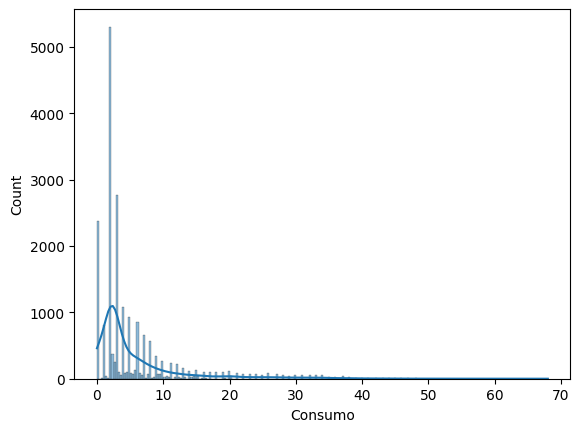

In [26]:
sns.histplot(df_HM["Consumo"], kde=True)

<Axes: xlabel='Consumo'>

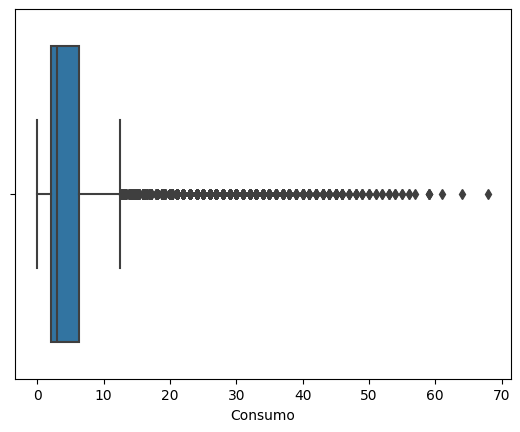

In [27]:
sns.boxplot(df_HM, x="Consumo" )

In [28]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df_HM['Date'],  # x-axis
    y=df_HM['Consumo'],  # y-axis
    mode='lines',  # Connect data points with lines
    name='Line'  # Name in the legend
))

# Layout parameters
fig.update_layout(
    title='Consumo Electrico con promedio MES y Hora',  # Title
    xaxis_title='Consumo [kW]',  # y-axis name
    yaxis_title='',  # x-axis name
    xaxis_tickangle=0,  # Set the x-axis label angle
    showlegend=False,     # Display the legend
)

#### hago un smoothing w/moving average

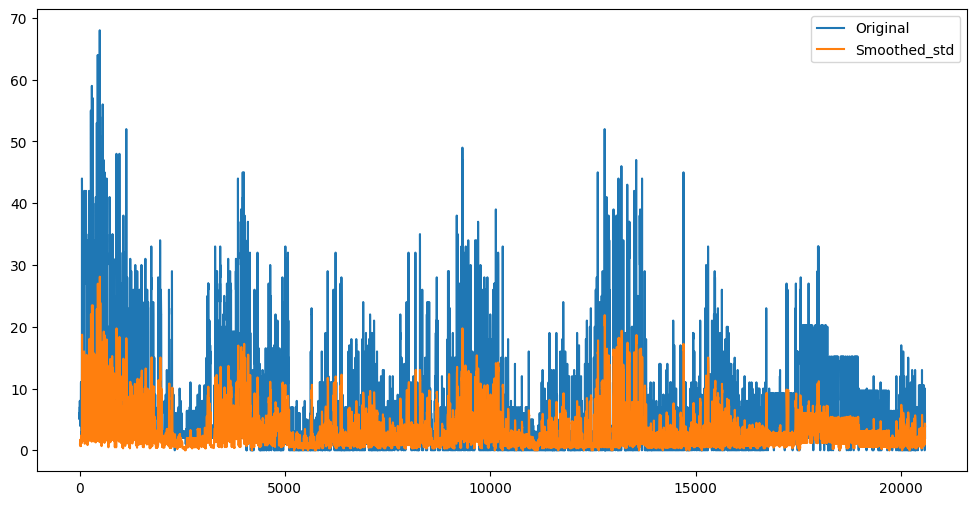

In [29]:
from statsmodels.robust.scale import mad

# Define the window size for the rolling mean
window_size = 10

# Calculate the rolling mean
df_HM['Consumo_smooth_mean'] = df_HM['Consumo'].rolling(window=window_size).mean()
df_HM['Consumo_smooth_std'] = df_HM['Consumo'].rolling(window=window_size).std()
df_HM['Consumo_smooth_MAD'] = df_HM['Consumo'].rolling(window=window_size).apply(mad)

# Plot the original and smoothed data
plt.figure(figsize=(12,6))
plt.plot(df_HM['Consumo'], label='Original')
# plt.plot(df_HM['Consumo_smooth_mean'], label='Smoothed_mean')
plt.plot(df_HM['Consumo_smooth_std'], label='Smoothed_std')
#plt.plot(df_HM['Consumo_smooth_MAD'], label='Smoothed_MAD')
plt.legend()
plt.show()

In [30]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df_HM.index,  # x-axis
    #y=df_HM['Consumo'],  # y-axis
    y=df_HM['Consumo_smooth_mean'],  # y-axis
    mode='lines',  # Connect data points with lines
    name='Line'  # Name in the legend
))

# Layout parameters
fig.update_layout(
    title='Consumo Electrico SUAVIZADO con promedio MES y Hora',  # Title
    xaxis_title='Consumo [kW]',  # y-axis name
    yaxis_title='',  # x-axis name
    xaxis_tickangle=0,  # Set the x-axis label angle
    showlegend=False,     # Display the legend
)

In [31]:
# Weekly Demand Plot

df_Week = df_HM.resample('1W').mean()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_Week.index, y=df_Week["Consumo"], mode='lines'))
fig.update_layout(
    title = "Weekly Energy Demand",
    xaxis_title = "Date",
    yaxis_title = "Demand (kWh)",
    width = 850,
    height = 400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'

In [ ]:
#sns.boxplot(df_HM, x="Consumo_smooth" )

In [ ]:
def decompose_time_series(df, column, freq):
    result = seasonal_decompose(df[column], model='additive', period=freq)
    df[f"{column}_trend"] = result.trend
    df[f"{column}_seasonal"] = result.seasonal
    df[f"{column}_residual"] = result.resid
    return df

df_HM.reset_index(inplace=True)

df_HM.dropna(inplace=True)

df_HM.set_index("Date", inplace=True)
decomposed_df = decompose_time_series(df_HM, "Consumo_smooth", 24)

# Plot the decomposed time series
fig, axes = plt.subplots(4, 1, figsize=(15, 10))
decomposed_df["Consumo_smooth"].plot(ax=axes[0], title="Original Series")
decomposed_df["Consumo_smooth_trend"].plot(ax=axes[1], title="Trend")
decomposed_df["Consumo_smooth_seasonal"].plot(ax=axes[2], title="Seasonal")
decomposed_df["Consumo_smooth_residual"].plot(ax=axes[3], title="Residual")
plt.tight_layout()

KeyError: 'Consumo_smooth'

## upsampling a 15 min

In [ ]:
df_upsampled = df2.copy()

In [ ]:
df_upsampled.set_index("Date", inplace=True)

In [ ]:
df_upsampled = df_upsampled.resample('15min').interpolate(method='time')
df_upsampled

,Consumo
Date,
2022-01-01 00:00:00,6.0
2022-01-01 00:15:00,6.0
2022-01-01 00:30:00,6.0
2022-01-01 00:45:00,6.0
2022-01-01 01:00:00,6.0
...,...
2024-05-07 22:00:00,2.0
2024-05-07 22:15:00,2.0
2024-05-07 22:30:00,2.0


In [ ]:
# # Guardar el DataFrame como pickle (se guarda el dataframe, manteniendo su estado actual)
# nombre_archivo = "consumoMonserratina_2022_2023.pkl"
# df_upsampled.to_pickle(os.path.join(ruta_data, nombre_archivo))
# print("DataFrame guardado con Pickle,b correctamente.")

# Outliers

In [ ]:
df3 = df_upsampled.copy()

In [ ]:
df3.reset_index(inplace=True)

In [ ]:
df3

,Date,Consumo
0,2022-01-01 00:00:00,6.0
1,2022-01-01 00:15:00,6.0
2,2022-01-01 00:30:00,6.0
3,2022-01-01 00:45:00,6.0
4,2022-01-01 01:00:00,6.0
...,...,...
82360,2024-05-07 22:00:00,2.0
82361,2024-05-07 22:15:00,2.0
82362,2024-05-07 22:30:00,2.0
82363,2024-05-07 22:45:00,2.0


In [ ]:
def getNumberOfOutliersPerColumn(df, columns_list):
    for col in columns_list:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1

        #Calcular los límites inferiores y superiores para identificar outliers
        lim_inf = q1 - 1.5 * iqr
        lim_sup = q3 + 1.5 * iqr

        outliers = ((df[col] < lim_inf) | (df[col] > lim_sup))
        print(f"For {col} Column, the Number of Outliers is {outliers.sum()}. Sus limites son {lim_inf} y {lim_sup}.\n")


getNumberOfOutliersPerColumn(df3, df3.columns.drop("Date"))

For Consumo Column, the Number of Outliers is 7381. Sus limites son -4.75 y 13.25.



In [ ]:
df3.describe()

,Date,Consumo
count,82365,82365.000000
mean,2023-03-05 23:30:00.000000256,5.557954
min,2022-01-01 00:00:00,0.000000
25%,2022-08-03 11:45:00,2.000000
50%,2023-03-05 23:30:00,3.000000
75%,2023-10-06 11:15:00,6.500000
max,2024-05-07 23:00:00,68.000000
std,NaN,7.004394


In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df3['Date'],  # x-axis
    y=df3['Consumo'],  # y-axis
    mode='lines',  # Connect data points with lines
    name='Line'  # Name in the legend
))

# Layout parameters
fig.update_layout(
    title='Consumo Electrico Casal La Monserratina - Años 2022, 2023 y 2024',  # Title
    xaxis_title='Consumo [kW]',  # y-axis name
    yaxis_title='',  # x-axis name
    xaxis_tickangle=0,  # Set the x-axis label angle
    showlegend=False,     # Display the legend
)

# Merge Consumo con PPV

In [ ]:
# Load the DataFrame from the pickle file
nombre_archivo = "LaMonserratina_weather_&_PV_2022_2023.pkl"
df_PV = pd.read_pickle(os.path.join(ruta_data, nombre_archivo))
df_PV.rename(columns={"timestamp_local": "Date"}, inplace=True)
#df_PV.set_index("Date", inplace=True)
df_PV.head(3)

,Date,pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],app_temp [C],rh [%],dewpt [C],...,PV,Temp interna Modulo [C],PV Wh,Year,Month,Hour,DayOfWeek,DayOfYear,Day,Minute
0,2022-01-01 00:00:00,1027.0,1028.0,360.0,4.0,1.0,10.7,10.7,92.0,9.500,...,0.0,22.066196,0.0,2022,1,0,5,1,1,0
1,2022-01-01 00:15:00,1027.0,1028.0,357.5,4.1,1.4,10.7,10.7,91.0,9.325,...,0.0,22.066196,0.0,2022,1,0,5,1,1,15
2,2022-01-01 00:30:00,1027.0,1028.0,355.0,4.2,1.8,10.7,10.7,90.0,9.150,...,0.0,22.066196,0.0,2022,1,0,5,1,1,30


In [ ]:
checkNaNValues(df_PV)
missing_dates, date_range = checkMissingData(df_PV, 'Date')

NaN Count per Column 0
Number of Missing Values: 0


In [ ]:
#df3.set_index("Date", inplace=True)
#df3.drop(columns=["index"], inplace=True)
df3.rename(columns={"Consumo": "Consumo [kW]"}, inplace=True)
df3.head(3)

,Date,Consumo [kW]
0,2022-01-01 00:00:00,6.0
1,2022-01-01 00:15:00,6.0
2,2022-01-01 00:30:00,6.0


In [ ]:
df4 = df3.merge(df_PV, how="inner", on=["Date", "Date"])

hay un probma con las unidades, Consumo de Red esta en kW, y PV en W.. ajusto PV/1000. y agrego las unidades a los nombres para evitar confusiones

In [ ]:
df4.rename(columns={'Consumo [kW]': 'Consumo_red [kW]'}, inplace=True)

df4["PV [kW]"] = (df4["PV"]/1000000).round(3)
df4.drop(columns=["PV"], inplace=True)

In [ ]:
df4["Consumo_total [kW]"] = df4["Consumo_red [kW]"] + df4["PV [kW]"]

In [ ]:
df4.sample(10)

,Date,Consumo_red [kW],pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],app_temp [C],rh [%],...,PV Wh,Year,Month,Hour,DayOfWeek,DayOfYear,Day,Minute,PV [kW],Consumo_total [kW]
29889,2022-11-08 08:15:00,3.750000,1016.00,1016.25,272.5,8.075,2.7250,13.150,13.150,78.75,...,1.942827e+06,2022,11,8,1,312,8,15,1.943,5.693000
15219,2022-06-08 12:45:00,28.500000,1011.00,1012.00,220.0,6.500,5.7975,25.225,25.700,71.25,...,4.588745e+06,2022,6,12,2,159,8,45,4.589,33.089000
24682,2022-09-15 02:30:00,2.000000,1009.00,1009.50,355.0,5.200,3.5950,23.200,23.600,77.50,...,0.000000e+00,2022,9,2,3,258,15,30,0.000,2.000000
57211,2023-08-19 22:45:00,2.000000,1017.00,1017.75,87.5,1.425,1.2750,26.925,29.750,82.00,...,0.000000e+00,2023,8,22,5,231,19,45,0.000,2.000000
68909,2023-12-19 19:15:00,24.750000,1024.00,1024.75,92.5,4.200,1.8975,11.575,11.575,48.25,...,0.000000e+00,2023,12,19,1,353,19,15,0.000,24.750000
56828,2023-08-15 23:00:00,3.000000,1015.00,1015.00,70.0,4.800,3.6000,26.700,29.400,84.00,...,0.000000e+00,2023,8,23,1,227,15,0,0.000,3.000000
79136,2024-04-04 08:00:00,3.000000,1018.00,1019.00,360.0,3.600,3.6000,11.400,11.400,75.00,...,1.717018e+06,2024,4,8,3,95,4,0,1.717,4.717000
70515,2024-01-05 12:45:00,5.819546,1001.25,1002.25,352.5,6.975,5.1750,13.450,13.450,67.25,...,4.161180e+06,2024,1,12,4,5,5,45,4.161,9.980546
41455,2023-03-08 19:45:00,7.250000,1007.00,1008.00,235.0,7.400,4.2150,15.525,15.525,64.50,...,0.000000e+00,2023,3,19,2,67,8,45,0.000,7.250000
42878,2023-03-23 15:30:00,0.000000,1014.00,1014.50,230.0,8.095,7.6950,15.550,15.550,77.00,...,4.441475e+06,2023,3,15,3,82,23,30,4.441,4.441000


## add some extra exogenous variables columns

In [ ]:
# #Generate a new column called Hour_sen and Hour_cos, wich is the hour 
# #transformed by the sine and cosine function
# def generateSinCosHour(df):
#     df['Hour_sen'] = np.sin((df['Hour'] / 24) * np.pi * 2)  # = SIN((A1*PI())/24)
#     df['Hour_cos'] = np.cos((df['Hour'] / 24) * np.pi * 2)
#     return df

In [ ]:
#Sine and Cosine Transformations
def cyclical_encoding(df, cycle_length_list, columns):
    for col, cycle_length in zip(columns, cycle_length_list):
        if df[col].min == 0:
            df[f"{col}_sin"] = np.sin((df[col] / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos((df[col] / cycle_length) * np.pi * 2).round(4)
        else:
            df[f"{col}_sin"] = np.sin(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
    return df

In [ ]:
df5 = df4.copy()

#Add Demand 7 days before Column
df5["Consumo_total [kW]_-7d"] = df5["Consumo_total [kW]"].shift(7 * 96).fillna(0)

#Add isWeekend Column based in DayOfTheWeek Value
df5["isWeekend"] = df5["DayOfWeek"].isin([5, 6])

# #Generate Sin and Cos Transformations
# df5 = generateSinCosHour(df5)

cycle_lengths = [24, 7, 12, 365]
cols = ["Hour", "DayOfWeek", "Month", "DayOfYear"]

df5 = cyclical_encoding(df5, cycle_lengths, cols)

df5.sample(5)

,Date,Consumo_red [kW],pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],app_temp [C],rh [%],...,Consumo_total [kW]_-7d,isWeekend,Hour_sin,Hour_cos,DayOfWeek_sin,DayOfWeek_cos,Month_sin,Month_cos,DayOfYear_sin,DayOfYear_cos
57238,2023-08-20 05:30:00,2.500000,1016.0,1017.00,320.0,3.0,1.500,24.600,25.250,80.50,...,2.000000,True,0.8660,0.5000,-0.9749,-0.2225,-0.500,-0.866,-0.7412,-0.6713
79236,2024-04-05 09:00:00,7.152269,1020.0,1020.00,10.0,3.2,2.100,13.400,13.400,82.00,...,11.157269,False,0.8660,-0.5000,0.4339,-0.9010,1.000,0.000,0.9979,-0.0645
8242,2022-03-27 20:30:00,2.500000,1024.0,1025.00,80.0,7.2,5.395,15.200,15.200,64.00,...,2.500000,True,-0.9659,0.2588,-0.9749,-0.2225,0.866,0.500,0.9942,0.1074
24985,2022-09-18 06:15:00,2.000000,1015.0,1015.25,142.5,6.4,2.225,20.875,20.225,47.25,...,2.000000,True,0.9659,0.2588,-0.9749,-0.2225,-0.866,-0.500,-0.9721,-0.2345
21098,2022-08-08 18:30:00,0.500000,1014.0,1015.00,180.0,5.4,2.850,30.400,32.000,52.00,...,3.756000,False,-0.9659,-0.2588,-0.7818,0.6235,-0.500,-0.866,-0.5878,-0.8090


In [ ]:
# df5 = df4.copy()

# #Add Demand 7 days before Column
# df5["Consumo_total [kW]_-7d"] = df5["Consumo_total [kW]"].shift(7 * 96).fillna(0)

# #Add isWeekend Column based in DayOfTheWeek Value
# df5["isWeekend"] = df5["DayOfWeek"].isin([5, 6])

# #Generate Sin and Cos Transformations
# df5 = generateSinCosHour(df5)

# df5.sample(5)

In [ ]:
#Add Demand 7 days before Column
df5["Consumo_total [kW]_-24h"] = df5["Consumo_total [kW]"].shift(96).fillna(0)

In [ ]:
# #Add Demand 24 hours before Column 
# def getDayBeforeDemand(df, row):
#     date = row["Date"]
#     counter, demand_24h = 0, 0
#     if row.isWeekend:
#         while counter < 7:
#             date -= timedelta(days=1)
#             row_24h = df.loc[df["Date"] == date]
#             if not row_24h.empty:
#                 row_24h = row_24h.iloc[[0]].squeeze()
#                 if row_24h["isWeekend"]:
#                     demand_24h = row_24h["Consumo_total [kW]"]
#                     break
#             counter += 1
#     else:
#         while counter < 7:
#             date -= timedelta(days=1)
#             row_24h = df.loc[df["Date"] == date]
#             if not row_24h.empty:
#                 row_24h = row_24h.iloc[[0]].squeeze()
#                 if row_24h["isWeekend"]:
#                     demand_24h = row_24h["Consumo_total [kW]"]
#                     break
#             counter += 1
#     return demand_24h

# df5["Demand_24h"] = df5.apply(
#     lambda row: getDayBeforeDemand(df5, row), axis=1)

In [ ]:
def generateHolidayVar(df):
    df["Reduced_Date"] = df["Date"].dt.date
    list_holidays = holidays.Spain(prov="CT", years=list(df["Year"].unique()))
    list_holidays_dates = np.array(list(list_holidays.keys()), dtype='datetime64')
    df["isHoliday"] = df["Reduced_Date"].isin(list_holidays_dates)
    df = df.drop('Reduced_Date', axis=1)
    return df

df5 = generateHolidayVar(df5)
display(df5[["Date", "isHoliday"]].sample(5))

,Date,isHoliday
45232,2023-04-17 04:00:00,False
6590,2022-03-10 15:30:00,False
65442,2023-11-13 16:30:00,False
72498,2024-01-26 04:30:00,False
41050,2023-03-04 14:30:00,False


# Plots

## Demand Distribution Plots

In [32]:
df5.head()

,TimeStamp,Valor,Període tarifari,Tipus lectura
0,01/01/2024 00:00,2,6,Real
1,01/01/2024 01:00,2,6,Real
2,01/01/2024 02:00,2,6,Real
3,01/01/2024 03:00,2,6,Real
4,01/01/2024 04:00,2,6,Real


In [ ]:
sns.histplot(df5["Consumo_total [kW]"])

KeyError: 'Consumo_total [kW]'

KeyError: 'Month'

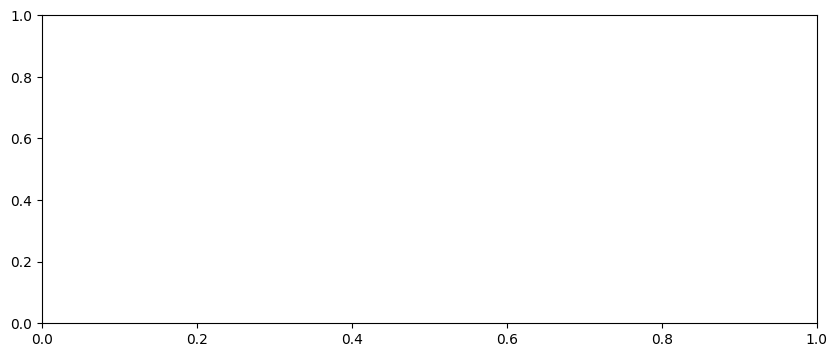

In [33]:
fig, ax = plt.subplots(figsize=(10, 4))
df5.boxplot(column='Consumo_total [kW]', by='Month', ax=ax)
df5.groupby('Month')['Consumo_total [kW]'].median().plot(style='o-', linewidth=.8, ax=ax)
ax.set_ylabel('Consumo_total [kW]')
ax.set_title("Consumo total (Red + PPV) by Month")
fig.suptitle('')

Text(0.5, 0.98, '')

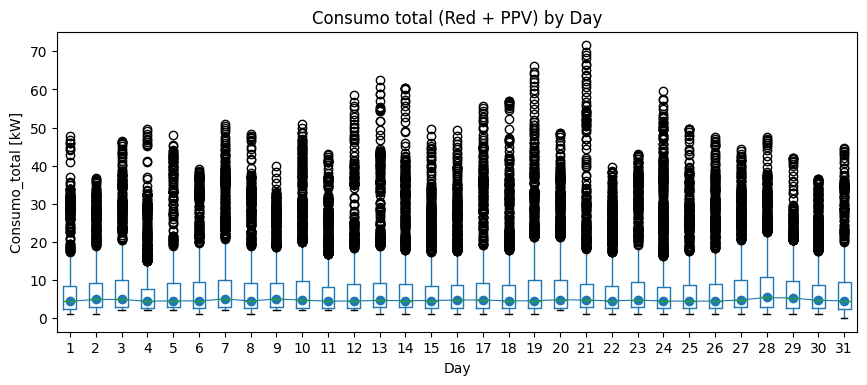

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))
df5.boxplot(column='Consumo_total [kW]', by='Day', ax=ax)
df5.groupby('Day')['Consumo_total [kW]'].median().plot(style='o-', linewidth=.8, ax=ax)
ax.set_ylabel('Consumo_total [kW]')
ax.set_title("Consumo total (Red + PPV) by Day")
fig.suptitle('')

Text(0.5, 0.98, '')

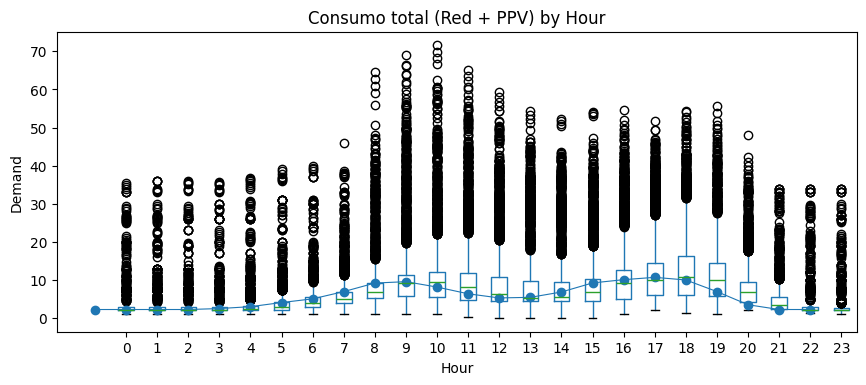

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))
df5.boxplot(column='Consumo_total [kW]', by='Hour', ax=ax)
df5.groupby('Hour')['Consumo_total [kW]'].median().plot(style='o-', linewidth=.8, ax=ax)
ax.set_ylabel('Demand')
ax.set_title("Consumo total Horas")
fig.suptitle('')

In [ ]:
# # Weekly Demand Plot
# whole_df.set_index('Date', inplace=True)
# whole_df_1w = whole_df.resample('1W').mean()
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=whole_df_1w.index, y=whole_df_1w["Demand"], mode='lines'))
# fig.update_layout(
#     title = "Weekly Energy Demand",
#     xaxis_title = "Date",
#     yaxis_title = "Demand (MWh)",
#     width = 850,
#     height = 400,
#     margin=dict(l=20, r=20, t=35, b=20),
#     legend=dict(
#         orientation="h",
#         yanchor="top",
#         y=1,
#         xanchor="left",
#         x=0.001
#     )
# )
# fig.show()

#### Demand per Day and Season

In [ ]:
days_mapping = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
df5["Day"] = df5["DayOfWeek"].map(days_mapping)
df5["Season"] = df5["Month"].apply(
    lambda x: (
        1 if x in [3, 4, 5] #Spring
        else 2 if x in [6, 7, 8] #Summer
        else 3 if x in [9, 10, 11] #Autumn
        else 0 #Winter
    )
)
fig, axes = plt.subplots(2, 2)
plt.subplots_adjust(wspace=0.2, hspace=0.3, top=0.92)
fig.suptitle("Mean Demand per Season", fontsize=16)

fig.set_figheight(10)
fig.set_figwidth(15)

ymin, ymax = 0, 25

#Season Summer
df5.loc[df5["Season"] == 2] \
    .groupby([df5.loc[df5["Season"] == 2]["Hour"], 'Day'])["Consumo_total [kW]"].mean().unstack().plot(
        ax=axes[0, 0], ylim=(ymin, ymax), title="Summer", legend=False
    )
df5.loc[df5["Season"] == 3] \
    .groupby([df5.loc[df5["Season"] == 3]["Hour"], 'Day'])["Consumo_total [kW]"].mean().unstack().plot(
        ax=axes[0, 1], ylim=(ymin, ymax), title="Autumn", legend=False
    )
df5.loc[df5["Season"] == 0] \
    .groupby([df5.loc[df5["Season"] == 0]["Hour"], 'Day'])["Consumo_total [kW]"].mean().unstack().plot(
        ax=axes[1, 0], ylim=(ymin, ymax), title="Winter", legend=False
    )
df5.loc[df5["Season"] == 1] \
    .groupby([df5.loc[df5["Season"] == 1]["Hour"], 'Day'])["Consumo_total [kW]"].mean().unstack().plot(
        ax=axes[1, 1], ylim=(ymin, ymax), title="Spring", legend=False
    )

for ax in axes.flat:
    ax.set(xlabel='hour', ylabel='Power consumption (red + PPV)  kWh')

for n in range(0, 2):
    axes[n, 0].set_xticks([0, 4, 8, 12, 16, 20])
    axes[n, 1].set_xticks([0, 4, 8, 12, 16, 20])
df5 = df5.drop("Day", axis=1)
# LEGEND
handles, labels = plt.gca().get_legend_handles_labels() # reorder Legend Labels
order = [1,5,6,4,0,2,3]      # specify order in Legend
axes[1,1].legend([handles[i] for i in order], [labels[i] for i in order], loc=1, ncol=7, 
                 bbox_to_anchor=(0.638,-0.2), frameon=True) # print and order LEGEND

NameError: name 'df5' is not defined

Text(0.5, 0.98, '')

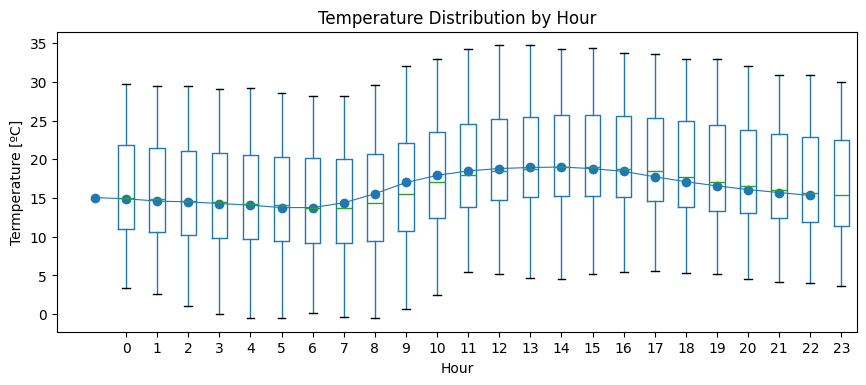

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))
df5.boxplot(column='temp [C]', by='Hour', ax=ax)
df5.groupby('Hour')['temp [C]'].median().plot(style='o-', linewidth=.8, ax=ax)
ax.set_ylabel('Termperature [ºC]')
ax.set_title("Temperature Distribution by Hour")
fig.suptitle('')

Text(0.5, 0.98, '')

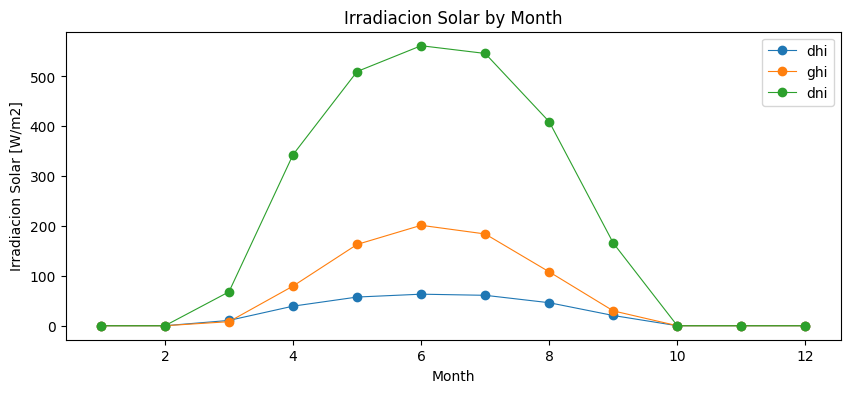

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))

# df_PV.boxplot(column='dhi [W/m^2]', by='Month', ax=ax)
df_PV.groupby('Month')['dhi [W/m^2]'].median().plot(style='o-', linewidth=.8, ax=ax)

# df_PV.boxplot(column='ghi [W/m^2]', by='Month', ax=ax)
df_PV.groupby('Month')['ghi [W/m^2]'].median().plot(style='o-', linewidth=.8, ax=ax)

# df_PV.boxplot(column='dni [W/m^2]', by='Month', ax=ax)
df_PV.groupby('Month')['dni [W/m^2]'].median().plot(style='o-', linewidth=.8, ax=ax)

ax.legend(['dhi', 'ghi', 'dni'])

# dhi                      Irradiancia solar difusa en el plano horizontal    W/m2 [Clear Sky] 
# ghi                      Irradiancia solar global en el plano horizontal    W/m2 [Clear Sky] 
# dni                      Irradiancia solar directa normal                   W/m2 [Clear Sky] 

ax.set_ylabel('Irradiacion Solar [W/m2]')
ax.set_title("Irradiacion Solar by Month")
fig.suptitle('')

Text(0.5, 0.98, '')

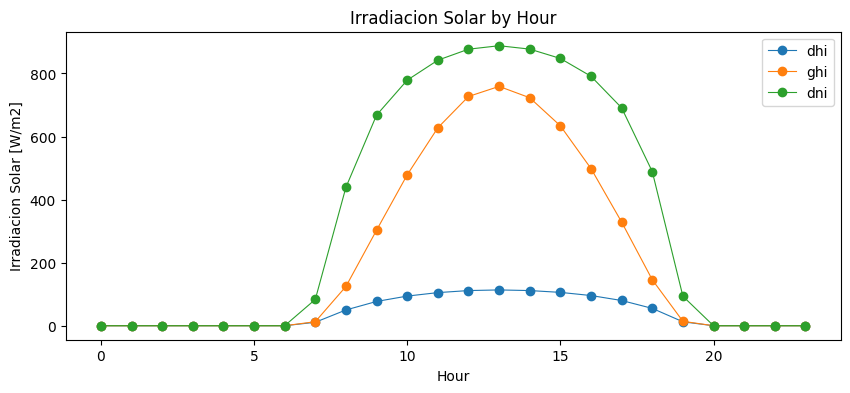

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))

# df_PV.boxplot(column='dhi [W/m^2]', by='Hour', ax=ax)
df_PV.groupby('Hour')['dhi [W/m^2]'].median().plot(style='o-', linewidth=.8, ax=ax)

# df_PV.boxplot(column='ghi [W/m^2]', by='Hour', ax=ax)
df_PV.groupby('Hour')['ghi [W/m^2]'].median().plot(style='o-', linewidth=.8, ax=ax)

# df_PV.boxplot(column='dni [W/m^2]', by='Hour', ax=ax)
df_PV.groupby('Hour')['dni [W/m^2]'].median().plot(style='o-', linewidth=.8, ax=ax)

ax.legend(['dhi', 'ghi', 'dni'])

# dhi                      Irradiancia solar difusa en el plano horizontal    W/m2 [Clear Sky] 
# ghi                      Irradiancia solar global en el plano horizontal    W/m2 [Clear Sky] 
# dni                      Irradiancia solar directa normal                   W/m2 [Clear Sky] 

ax.set_ylabel('Irradiacion Solar [W/m2]')
ax.set_title("Irradiacion Solar by Hour")
fig.suptitle('')

## AutoCorrelation Plots

In [ ]:
df5.head()

,Date,Consumo_red [kW],pres [mb],slp [mb],wind_dir [m/s],wind_gust_spd [m/s],wind_spd [m/s],temp [C],app_temp [C],rh [%],...,Hour_cos,DayOfWeek_sin,DayOfWeek_cos,Month_sin,Month_cos,DayOfYear_sin,DayOfYear_cos,Consumo_total [kW]_-24h,isHoliday,Season
0,2022-01-01 00:00:00,6.0,1027.0,1028.0,360.0,4.0,1.0,10.7,10.7,92.0,...,0.9659,-0.4339,-0.901,0.0,1.0,0.0,1.0,0.0,True,0
1,2022-01-01 00:15:00,6.0,1027.0,1028.0,357.5,4.1,1.4,10.7,10.7,91.0,...,0.9659,-0.4339,-0.901,0.0,1.0,0.0,1.0,0.0,True,0
2,2022-01-01 00:30:00,6.0,1027.0,1028.0,355.0,4.2,1.8,10.7,10.7,90.0,...,0.9659,-0.4339,-0.901,0.0,1.0,0.0,1.0,0.0,True,0
3,2022-01-01 00:45:00,6.0,1027.0,1028.0,352.5,4.3,2.2,10.7,10.7,89.0,...,0.9659,-0.4339,-0.901,0.0,1.0,0.0,1.0,0.0,True,0
4,2022-01-01 01:00:00,6.0,1027.0,1028.0,350.0,4.4,2.6,10.7,10.7,88.0,...,1.0000,-0.4339,-0.901,0.0,1.0,0.0,1.0,0.0,True,0


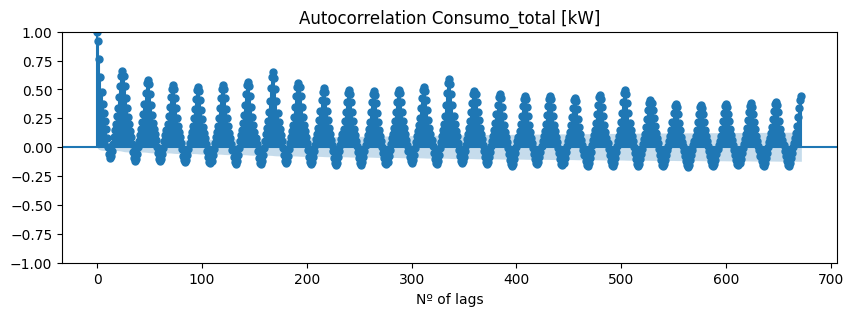

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
#Gráfico de autocorrelación 1
dfAutocorr = df5.copy()
dfAutocorr.set_index("Date", inplace=True)

dfAutocorr = dfAutocorr.resample('1h').mean()
fig, ax = plt.subplots(figsize=(10, 3))
plt.xlabel("Nº of lags")

plot_acf(dfAutocorr["Consumo_total [kW]"], ax=ax, lags=24*7*4)
plt.title("Autocorrelation Consumo_total [kW]")
plt.show()

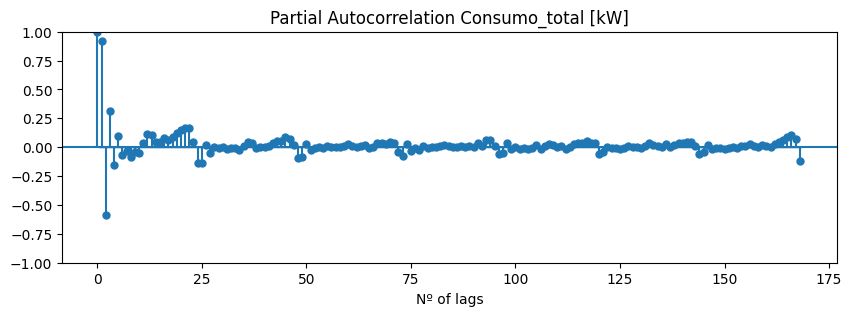

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
#Gráfico de autocorrelación parcial
fig, ax = plt.subplots(figsize=(10, 3))
plt.xlabel("Nº of lags")
plot_pacf(dfAutocorr["Consumo_total [kW]"], ax=ax, lags=24*7)
plt.title("Partial Autocorrelation Consumo_total [kW]")
plt.show()

## Correlation Matrix

In [ ]:
df5.columns

Index(['Date', 'Consumo_red [kW]', 'pres [mb]', 'slp [mb]', 'wind_dir [m/s]',
       'wind_gust_spd [m/s]', 'wind_spd [m/s]', 'temp [C]', 'app_temp [C]',
       'rh [%]', 'dewpt [C]', 'clouds [%]', 'vis [Km]', 'precip [mm]',
       'dhi [W/m^2]', 'dni [W/m^2]', 'ghi [W/m^2]', 'solar_rad [W/m^2]',
       'uv [0-11+]', 'elev_angle [º]', 'azimuth [º]', 'Temp interna Modulo',
       'Temp interna Modulo [C]', 'PV Wh', 'Year', 'Month', 'Hour',
       'DayOfWeek', 'DayOfYear', 'Minute', 'PV [kW]', 'Consumo_total [kW]',
       'Consumo_total [kW]_-7d', 'isWeekend', 'Hour_sin', 'Hour_cos',
       'DayOfWeek_sin', 'DayOfWeek_cos', 'Month_sin', 'Month_cos',
       'DayOfYear_sin', 'DayOfYear_cos', 'Consumo_total [kW]_-24h',
       'isHoliday', 'Season'],
      dtype='object')

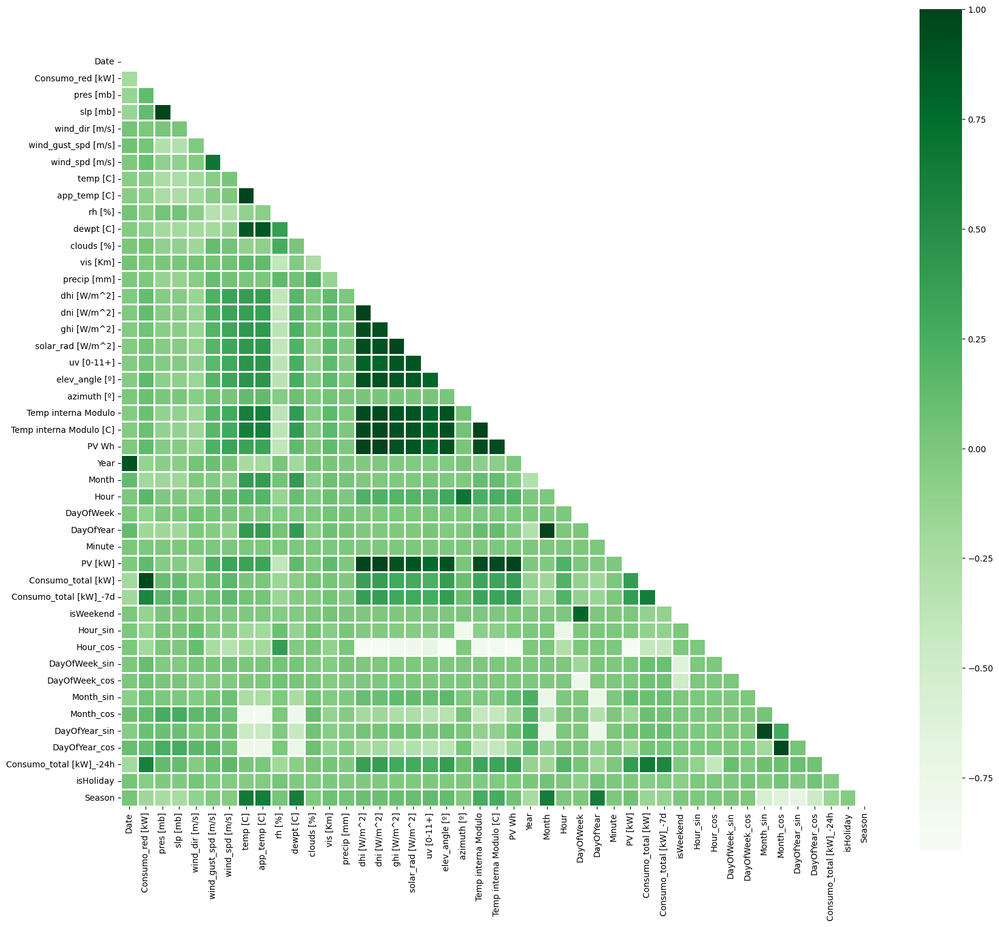

In [ ]:
# Calcula la matriz de correlación completa
correlation_matrix = df5.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(correlation_matrix)
mask[np.triu_indices_from(mask)] = True

# Imprime la matriz de correlación del cuadrante inferior
#plotting the heatmap for correlation
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, mask=mask, square=True, cmap='Greens', linewidths=2, linecolor='white');

c:\Users\afernandez\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



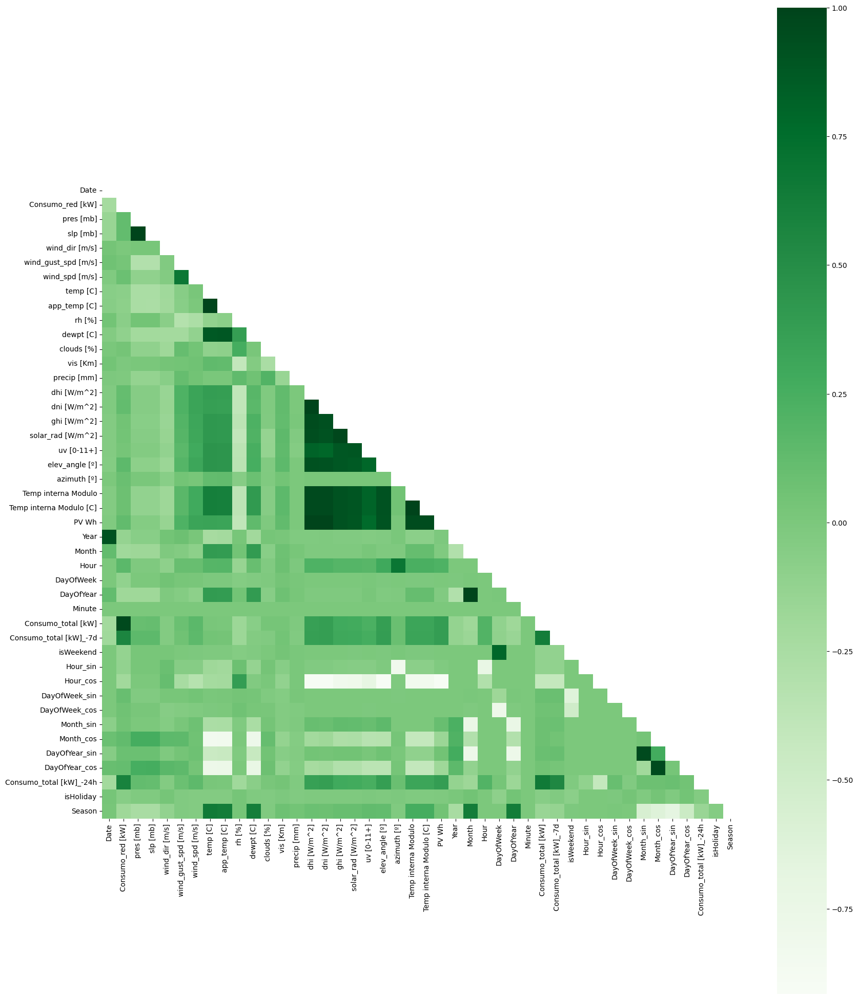

In [ ]:
# Calcula la matriz de correlación completa
df6 = df5.copy()
df6.drop(columns=["PV [kW]"], inplace=True)

correlation_matrix = df6.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(correlation_matrix)
mask[np.triu_indices_from(mask)] = True

# Imprime la matriz de correlación del cuadrante inferior
#plotting the heatmap for correlation
plt.figure(figsize=(20, 25))
sns.heatmap(correlation_matrix, mask=mask, square=True, cmap='Greens', annot=True);

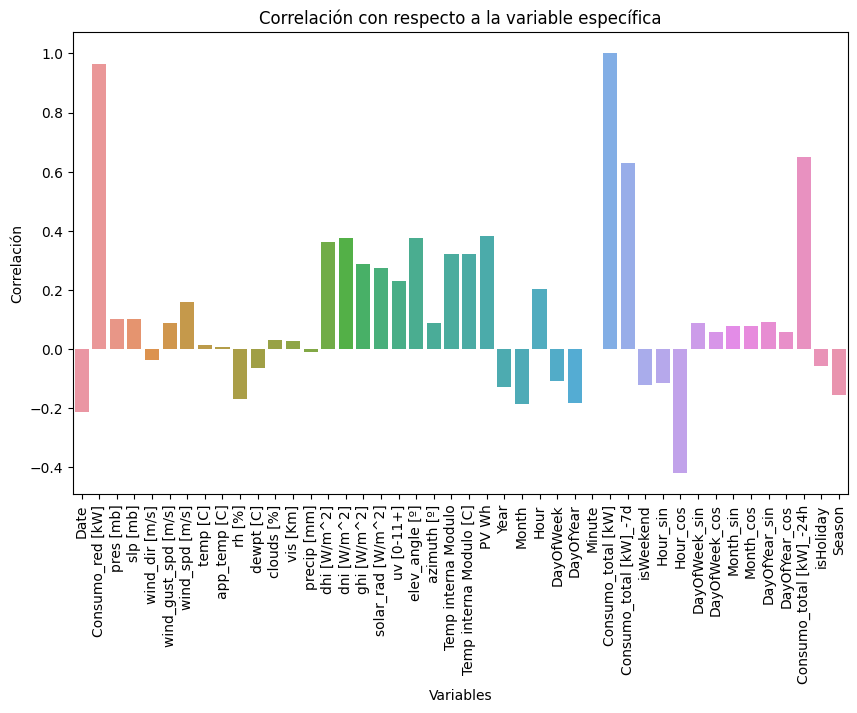

In [ ]:
# Crear un gráfico de barras de la correlación respecto a la variable específica
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_matrix.index, y=correlation_matrix['Consumo_total [kW]'])
plt.title('Correlación con respecto a la variable específica')
plt.xlabel('Variables')
plt.ylabel('Correlación')
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Guardar el DataFrame como CSV
nombre_archivo = "LaMonserratina_2022_2023_2024.csv"
ruta_completa = os.path.join(ruta_data, nombre_archivo)
df6.to_csv(ruta_completa, index=False)

## Time series decpomposition

In [ ]:

result=seasonal_decompose(df7['Consumo_total [kW]'], model='additive', period=96);  # 96 = 1 day in 15 min intervals 
result.plot()


NameError: name 'df7' is not defined

<Axes: xlabel='Date'>

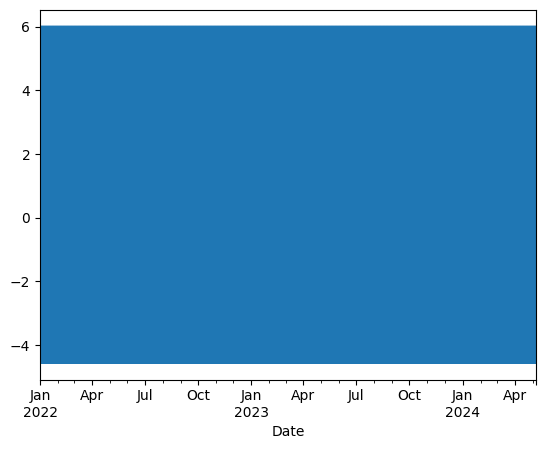

In [ ]:
result.seasonal.plot()

<Axes: xlabel='Date'>

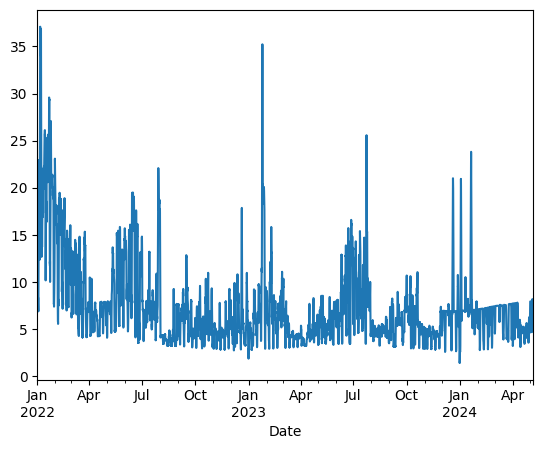

In [ ]:
result.trend.plot()

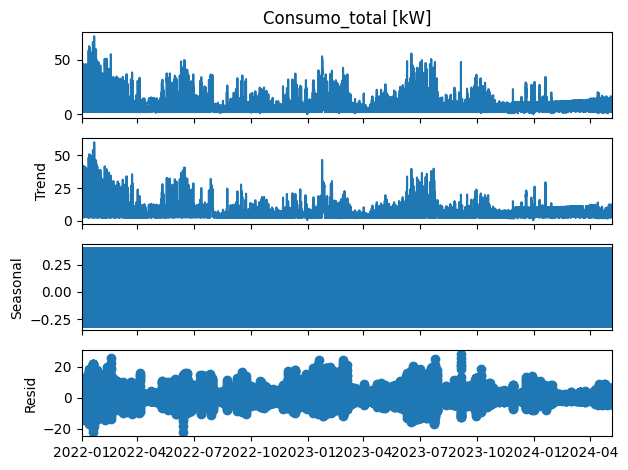

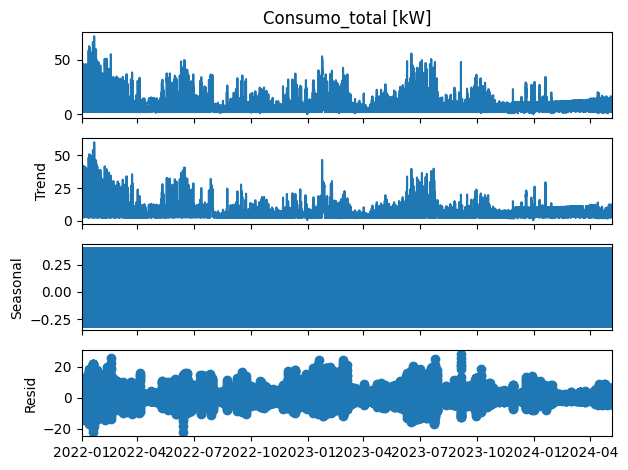

In [ ]:
result.plot()

KeyError: 'Consumo_total [kW]_trend'

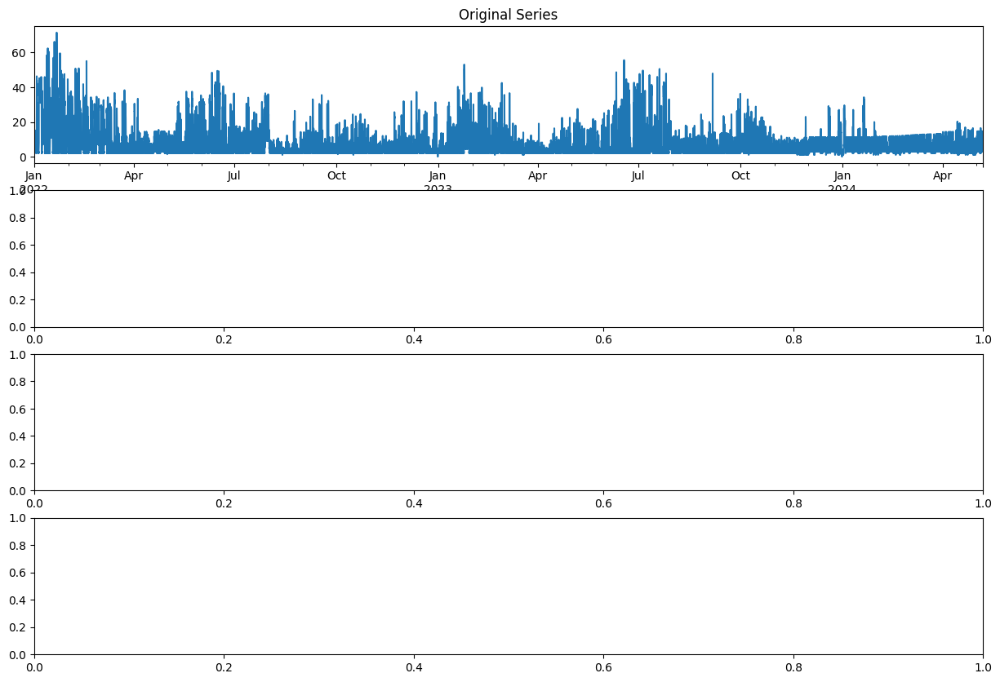

In [ ]:
def decompose_time_series(df, column, freq):
    result = seasonal_decompose(df[column], model='additive', period=freq)
    df[f"{column}_trend"] = result.trend
    df[f"{column}_seasonal"] = result.seasonal
    df[f"{column}_residual"] = result.resid
    return df

df7 = df6.copy()
df7.set_index("Date", inplace=True)
decomposed_df = decompose_time_series(df7, "Consumo_red [kW]", 1)



# Plot the decomposed time series
fig, axes = plt.subplots(4, 1, figsize=(15, 10))
decomposed_df["Consumo_total [kW]"].plot(ax=axes[0], title="Original Series")
decomposed_df["Consumo_total [kW]_trend"].plot(ax=axes[1], title="Trend")
decomposed_df["Consumo_total [kW]_seasonal"].plot(ax=axes[2], title="Seasonal")
decomposed_df["Consumo_total [kW]_residual"].plot(ax=axes[3], title="Residual")
plt.tight_layout()

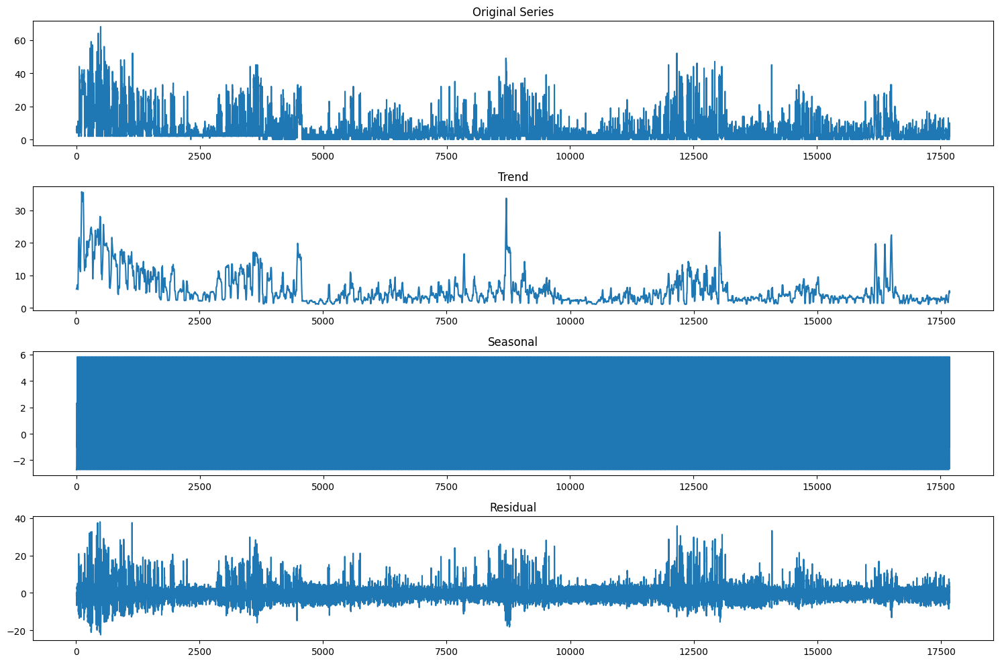

In [ ]:
def decompose_time_series(df, column, freq):
    result = seasonal_decompose(df[column], model='additive', period=freq)
    df[f"{column}_trend"] = result.trend
    df[f"{column}_seasonal"] = result.seasonal
    df[f"{column}_residual"] = result.resid
    return df


decomposed_df = decompose_time_series(df, "Consumo", 24)



# Plot the decomposed time series
fig, axes = plt.subplots(4, 1, figsize=(15, 10))
decomposed_df["Consumo"].plot(ax=axes[0], title="Original Series")
decomposed_df["Consumo_trend"].plot(ax=axes[1], title="Trend")
decomposed_df["Consumo_seasonal"].plot(ax=axes[2], title="Seasonal")
decomposed_df["Consumo_residual"].plot(ax=axes[3], title="Residual")
plt.tight_layout()